In [1]:
import os
import math
import scipy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import scanpy as sc
import bbknn
np.random.seed(42)
# Matplotlib command for Jupyter notebooks only
%matplotlib inline
save_to = '/home/mklein/Dropouts/figures/'

from pandarallel import pandarallel
pandarallel.initialize(nb_workers=25, progress_bar=True, use_memory_fs=False)

/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packag

INFO: Pandarallel will run on 25 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


In [2]:
import sys

sys.path.append("/home/mklein/sc_imputation_denoising")
from sc_imputation_denoising.imputation.constants import const

ds_dict = {
    "Seahorse": "Mx_Seahorse",
    "Pancreatic Cancer": "Lx_Pancreatic_Cancer",
    "Glioblastoma": "Lx_Glioblastoma",
    "HepaRG": "Lx_HepaRG",
}

from sc_imputation_denoising.imputation.simulation import (
    get_dropout_rate,
)

In [9]:
import sc_imputation_denoising as scid

save_adatas = os.path.join(
    scid.WD,
    "thesis_analysis/01_filtering",
    "data",
)

In [10]:
dataset_files = {
    "Pancreatic Cancer": "Lx_Pancreatic_Cancer.h5ad",
    "Seahorse": "Mx_Seahorse.h5ad",
    "Glioblastoma": "Lx_Glioblastoma.h5ad",
    "HepaRG": "Lx_HepaRG.h5ad",
}

datasets = {}
for name, path in dataset_files.items():
    adata_raw = sc.read(os.path.join(const.IN_DATA_DIR, path))
    print(adata_raw.obs.columns)

    if name == "Seahorse":
        adata_raw = adata_raw[
            ~adata_raw.obs["well"].isin(["A3", "G1", "J2", "E2", "E3", "E4"])
        ]
        # adata_raw = adata_raw[adata_raw.obs['dataset_0'].isin(['Stim', 'NStim'])]
        adata_raw.obs["batch"] = "none"
        adata_raw.obs["condition"] = adata_raw.obs["dataset_0"]

    elif name == "Glioblastoma":
        well_name = "well"
        condition_name = "condition"

        metadata_path = os.path.join(
            os.path.join(const.IN_DATA_DIR, "metaspace_datasets_GlioblastomaNEW.csv")
        )
        samples = list(set(adata_raw.obs["well"]))

        if os.path.exists(metadata_path):
            metadata = pd.read_csv(metadata_path)
            if well_name not in metadata.columns:
                metadata[well_name] = metadata["row"].astype(str) + metadata[
                    "col"
                ].astype(str)
            samples = list(metadata[well_name])

        def assign_conditions(adata):
            index = adata.obs.index.name
            if condition_name in adata.obs.columns:
                del adata.obs[condition_name]
            new_obs = adata.obs.reset_index()

            new_obs = pd.merge(
                new_obs,
                metadata[[well_name, condition_name]],
                how="inner",
                left_on="well",
                right_on=well_name,
            ).set_index(index)

            adata = adata[new_obs.index, :].copy()
            adata.obs = new_obs
            if "keep_conditions" in globals():
                adata = adata[adata.obs[condition_name].isin(keep_conditions), :].copy()
            return adata

        adata_raw = assign_conditions(adata_raw)
        adata_raw.obs["batch"] = "none"

    elif name == "Pancreatic Cancer":
        adata_raw.obs["dataset"] = "none"
        adata_raw.obs["batch"] = adata_raw.obs["dataset_2"]
        adata_raw.obs["sample"] = adata_raw.obs["well"]
        metadata = pd.read_csv(
            os.path.join(const.IN_DATA_DIR, "PancreaticCancer_datasets.csv")
        )
        metadata["sample"] = (
            "S" + metadata["slide"].astype(str) + "_W" + metadata["well"].astype(str)
        )
        merge_df = pd.merge(
            adata_raw.obs, metadata[["sample", "condition"]], how="inner", on="sample"
        )
        merge_df.index = adata_raw.obs_names
        adata_raw.obs = merge_df
        adata_raw.var["fdr"] = 1

    elif name == "HepaRG":
        adata_raw.X = adata_raw.raw.X
        adata_raw.obs["sample"] = adata_raw.obs["slide_id"]
        adata_raw.obs["well"] = adata_raw.obs["slide_id"]
        adata_raw.var["fdr"] = 1
        adata_raw.obs.index.name = "cell_id"

    sc.pp.filter_cells(adata_raw, min_genes=1)
    sc.pp.filter_genes(adata_raw, min_cells=1)
    print(name)
    get_dropout_rate(adata_raw)
    print(adata_raw.shape)

    adata_raw.layers["raw"] = adata_raw.X.copy()
    adata_raw.layers["zero_mask"] = adata_raw.X.copy() == 0
    adata_raw.layers["log_raw"] = np.log1p(adata_raw.X)

    datasets[name] = adata_raw

print(datasets)

Index(['center_x', 'center_y', 'cell_area', 'cell_sampling_area',
       'cell_sampling_ratio', 'cell_nearest_am_distance',
       'cell_nearest_cell_distance', 'centroid-0', 'centroid-1', 'bbox-0',
       ...
       'sampled_min_intensity-DAPI', 'sampled_mean_intensity-DAPI',
       'sampled_median_intensity-DAPI', 'sampled_sum_intensity-DAPI',
       'dataset', 'well', 'dataset_0', 'dataset_1', 'dataset_2', 'dataset_3'],
      dtype='object', length=103)
Pancreatic Cancer
Global dropout rate:  86.57%
(15685, 1667)
Index(['center_x', 'center_y', 'cell_area', 'cell_sampling_area',
       'cell_sampling_ratio', 'cell_nearest_am_distance',
       'cell_nearest_cell_distance', 'centroid-0', 'centroid-1', 'bbox-0',
       ...
       'sum_intensity-DAPI', 'sampled_max_intensity-DAPI',
       'sampled_min_intensity-DAPI', 'sampled_mean_intensity-DAPI',
       'sampled_median_intensity-DAPI', 'sampled_sum_intensity-DAPI',
       'dataset', 'well', 'dataset_0', 'dataset_1'],
      dtype='objec

/tmp/ipykernel_1076/1243755800.py:18: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw.obs["batch"] = "none"


Seahorse
Global dropout rate:  71.27%
(9908, 966)
Index(['center_x', 'center_y', 'cell_area', 'cell_sampling_area',
       'cell_sampling_ratio', 'cell_nearest_am_distance',
       'cell_nearest_cell_distance', 'centroid-0', 'centroid-1', 'bbox-0',
       ...
       'sampled_min_intensity-DAPI', 'sampled_mean_intensity-DAPI',
       'sampled_median_intensity-DAPI', 'sampled_sum_intensity-DAPI',
       'dataset', 'well', 'dataset_0', 'dataset_1', 'dataset_2', 'dataset_3'],
      dtype='object', length=103)
Glioblastoma
Global dropout rate:  79.01%
(10848, 1503)
Index(['slide_id', 'project_id', 'dataset_name', 'batch', 'cell_id',
       'condition', 'n_genes', 'leiden', 'cell_area', 'cell_sampled_area',
       ...
       'location_intensity_center_mass-0-OrigBlue',
       'location_intensity_center_mass-0-OrigRed_highDR',
       'location_intensity_max-1-OrigBlue',
       'location_intensity_max-1-OrigRed_highDR',
       'location_intensity_max-0-OrigBlue',
       'location_intensity_max

In [ ]:
subsets = [0, 0.05, 0.1, 0.2, 0.3]

res_list = []
if not os.path.exists(save_adatas):
    os.makedirs(save_adatas)

for name, adata_template in tqdm(datasets.items()):
    for subset_c in subsets:
        for subset_i in subsets:
            path = os.path.join(
                save_adatas,
                name + "_subset_" + str(subset_i) + "_" + str(subset_c) + ".h5ad",
            )
            adata = adata_template.copy()
            sc.pp.filter_cells(adata, min_genes=len(adata.var_names) * subset_i)
            sc.pp.filter_genes(adata, min_cells=len(adata.obs_names) * subset_c)
            try:
                dr = get_dropout_rate(adata)
                sc.write(path, adata.copy())

                res_list.append(
                    dict(
                        dataset=name,
                        subset_ions=subset_i,
                        subset_cells=subset_c,
                        dr=dr,
                        adata_path=path,
                    )
                )
            except:
                print("failed", subset_i, subset_c, name)

res_df = pd.DataFrame(res_list)
res_df

Global dropout rate:  85.42%
Global dropout rate:  78.50%
failed 0.3 0 Pancreatic Cancer
Global dropout rate:  69.92%
Global dropout rate:  69.78%
Only considering the two last: ['.05', '.h5ad'].
Only considering the two last: ['.05', '.h5ad'].
Global dropout rate:  68.15%
Only considering the two last: ['.05', '.h5ad'].
Only considering the two last: ['.05', '.h5ad'].


: 

failed 0.1 0.05 Pancreatic Cancer


sys:1: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f44f0aaaa40>


Global dropout rate:  59.15%
Only considering the two last: ['.05', '.h5ad'].
Only considering the two last: ['.05', '.h5ad'].
failed 0.3 0.05 Pancreatic Cancer
Global dropout rate:  62.48%


In [5]:
res_df.to_csv(os.path.join(save_adatas, "results.csv"))

In [11]:
res_df = pd.read_csv(os.path.join(save_adatas, "results.csv"), index_col=0)
res_df

,dataset,subset_ions,subset_cells,dr,adata_path
0,Pancreatic Cancer,0.00,0.00,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...
1,Pancreatic Cancer,0.05,0.00,0.865091,/home/mklein/sc_imputation_denoising/thesis_an...
2,Pancreatic Cancer,0.10,0.00,0.854152,/home/mklein/sc_imputation_denoising/thesis_an...
3,Pancreatic Cancer,0.20,0.00,0.785042,/home/mklein/sc_imputation_denoising/thesis_an...
4,Pancreatic Cancer,0.00,0.05,0.699218,/home/mklein/sc_imputation_denoising/thesis_an...
...,...,...,...,...,...
89,HepaRG,0.30,0.20,0.381638,/home/mklein/sc_imputation_denoising/thesis_an...
90,HepaRG,0.00,0.30,0.344426,/home/mklein/sc_imputation_denoising/thesis_an...
91,HepaRG,0.10,0.30,0.344232,/home/mklein/sc_imputation_denoising/thesis_an...
92,HepaRG,0.20,0.30,0.338965,/home/mklein/sc_imputation_denoising/thesis_an...


In [12]:
def calc_umap(row, euclidean=False):
    if euclidean:
        bbmetric = "euclidean"
        neighmetric = "euclidean"
    else:
        bbmetric = "angular"
        neighmetric = "cosine"

    subset_c = row["subset_cells"]
    subset_i = row["subset_ions"]
    name = row["dataset"]
    path = os.path.join(
        save_adatas,
        name
        + "_subset_"
        + str(subset_i)
        + "_"
        + str(subset_c)
        + "_"
        + neighmetric
        + "_umap.csv",
    )
    if os.path.exists(path):
        return path

    adata = sc.read_h5ad(row["adata_path"])
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.pca(adata)
    if row["dataset"] == "Pancreatic Cancer":
        bbknn.bbknn(
            adata,
            metric=bbmetric,
            batch_key="batch",
            neighbors_within_batch=8,
            n_pcs=50,
        )
    else:
        # sc.pp.neighbors(adata)
        sc.pp.neighbors(adata, n_neighbors=50, metric=neighmetric)
    # sc.tl.umap(adata)
    sc.tl.umap(adata, min_dist=0.5, spread=1.0, random_state=1, n_components=2)

    df = sc.get.obs_df(
        adata, keys=["condition", "well"], obsm_keys=[("X_umap", 0), ("X_umap", 1)]
    )

    for col in row.index:
        if col != "adata":
            df[col] = row[col]

    df.to_csv(path)
    return path

In [13]:
res_df["umap_path_euclidean"] = res_df.parallel_apply(
    lambda row: calc_umap(row, euclidean=True), axis=1
)
res_df["umap_path_cosine"] = res_df.parallel_apply(
    lambda row: calc_umap(row, euclidean=False), axis=1
)

/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f4180762680>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f417c4ddea0>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f4180762680>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f417c4ddea0>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f4180762680>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.

/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f4180762680>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f417c4ddea0>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f4180762680>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f417c4ddea0>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.py:66: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f4180762680>
  self.pid = os.fork()
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/multiprocessing/popen_fork.

In [14]:
res_df

,dataset,subset_ions,subset_cells,dr,adata_path,umap_path_euclidean,umap_path_cosine
0,Pancreatic Cancer,0.00,0.00,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
1,Pancreatic Cancer,0.05,0.00,0.865091,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
2,Pancreatic Cancer,0.10,0.00,0.854152,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
3,Pancreatic Cancer,0.20,0.00,0.785042,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
4,Pancreatic Cancer,0.00,0.05,0.699218,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
...,...,...,...,...,...,...,...
89,HepaRG,0.30,0.20,0.381638,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
90,HepaRG,0.00,0.30,0.344426,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
91,HepaRG,0.10,0.30,0.344232,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
92,HepaRG,0.20,0.30,0.338965,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...


In [8]:
def get_umap_coords(row):
    umap_path = row['umap_path_cosine']
    try:
        df = pd.read_csv(umap_path, index_col=0)
        return df
    except:
        return pd.DataFrame()


umaps_df = pd.concat(res_df.apply(get_umap_coords, axis=1).tolist())
umaps_df.to_csv(os.path.join(save_adatas, "umaps_different_filtering.csv"))
umaps_df

,condition,well,X_umap-0,X_umap-1,dataset,subset_ions,subset_cells,dr,adata_path,umap_path_euclidean
cell_id,,,,,,,,,,
21_S3_W5,MiaPaca2,S3_W5,14.601460,3.101327,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
24_S3_W5,MiaPaca2,S3_W5,15.326284,2.782329,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
28_S3_W5,MiaPaca2,S3_W5,13.706941,5.817554,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
29_S3_W5,MiaPaca2,S3_W5,12.043072,5.415295,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
31_S3_W5,MiaPaca2,S3_W5,11.546455,5.311803,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
...,...,...,...,...,...,...,...,...,...,...
2412,FIT,U4,11.516843,7.337802,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
2408,FIT,U4,11.582747,7.487314,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
2405,FIT,U4,8.947655,7.786212,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...


In [15]:
umaps_df = pd.read_csv(os.path.join(save_adatas, "umaps_different_filtering.csv"))

/tmp/ipykernel_1076/1648376968.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  umaps_df = pd.read_csv(os.path.join(save_adatas, "umaps_different_filtering.csv"))


In [16]:
plt.style.use("tableau-colorblind10")

subset_filters = [0.0, 0.05, 0.1, 0.2, 0.3]
dot_size = 4
plot_height = 3

Pancreatic Cancer


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


Seahorse


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


Glioblastoma


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


HepaRG


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


HepaRG 5% 30% failed


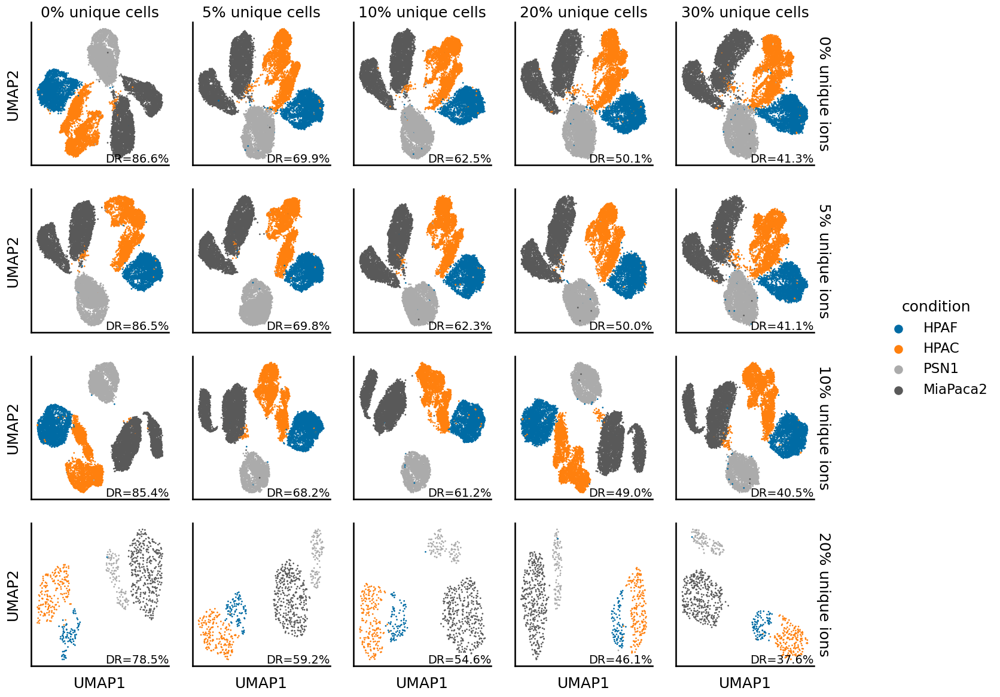

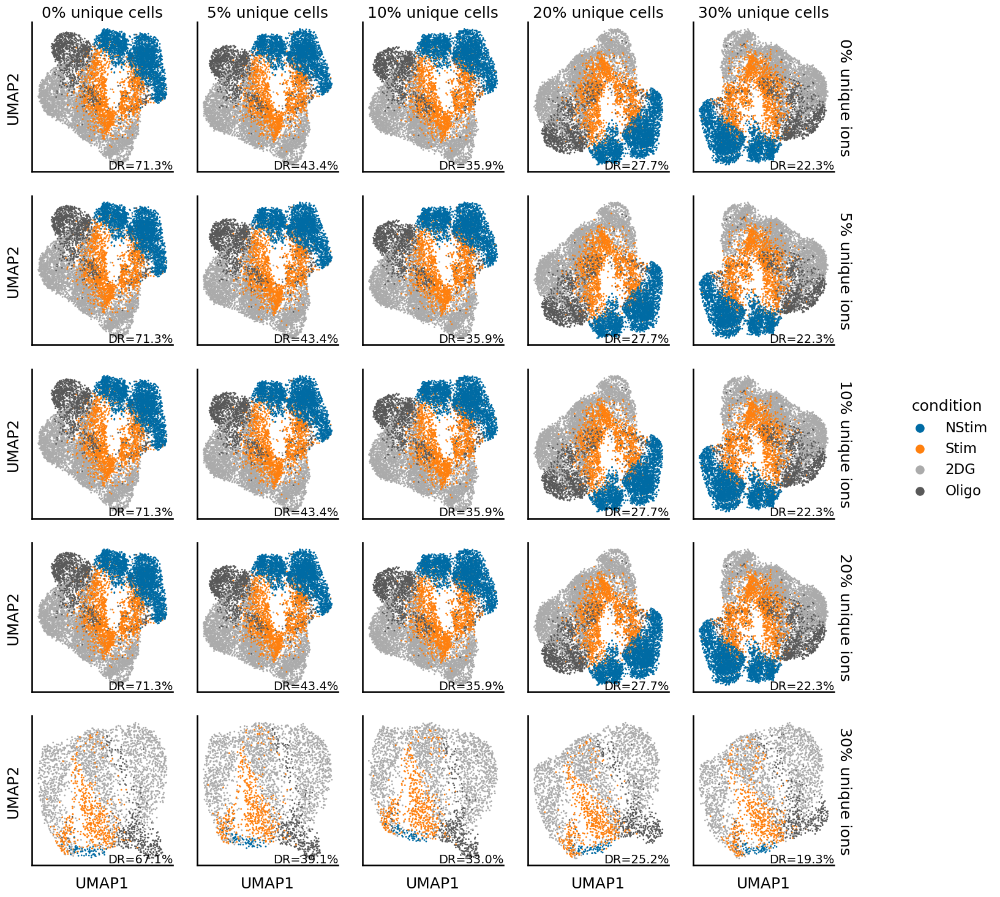

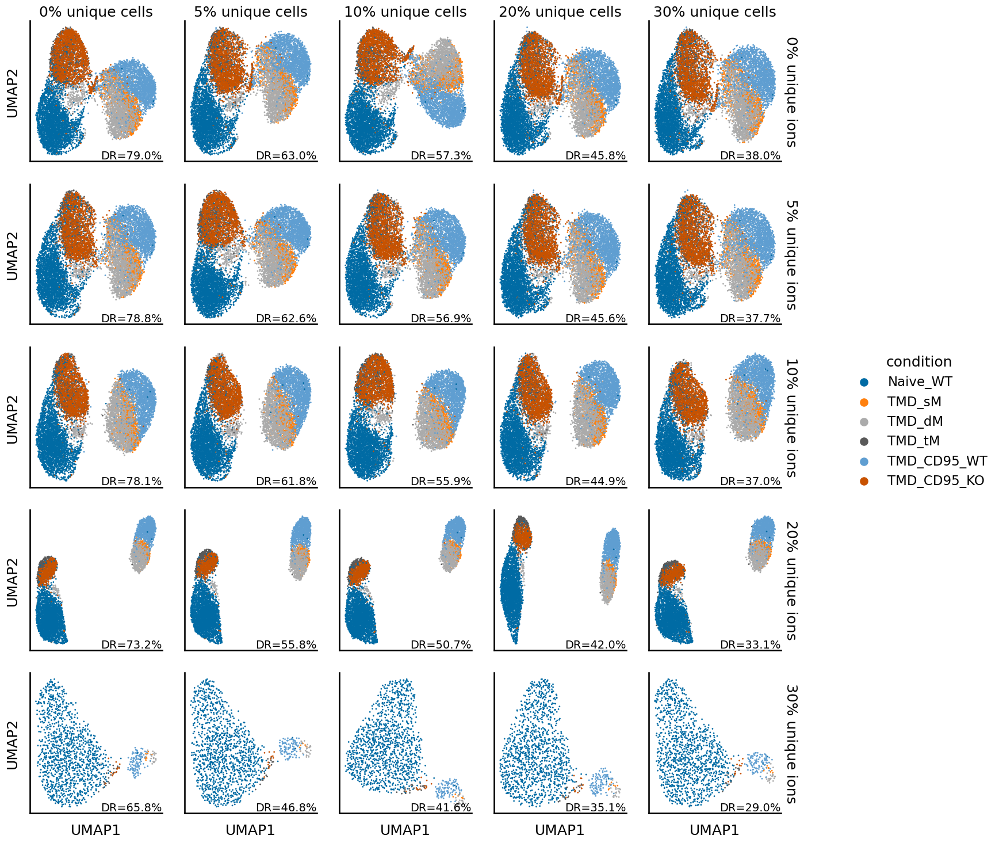

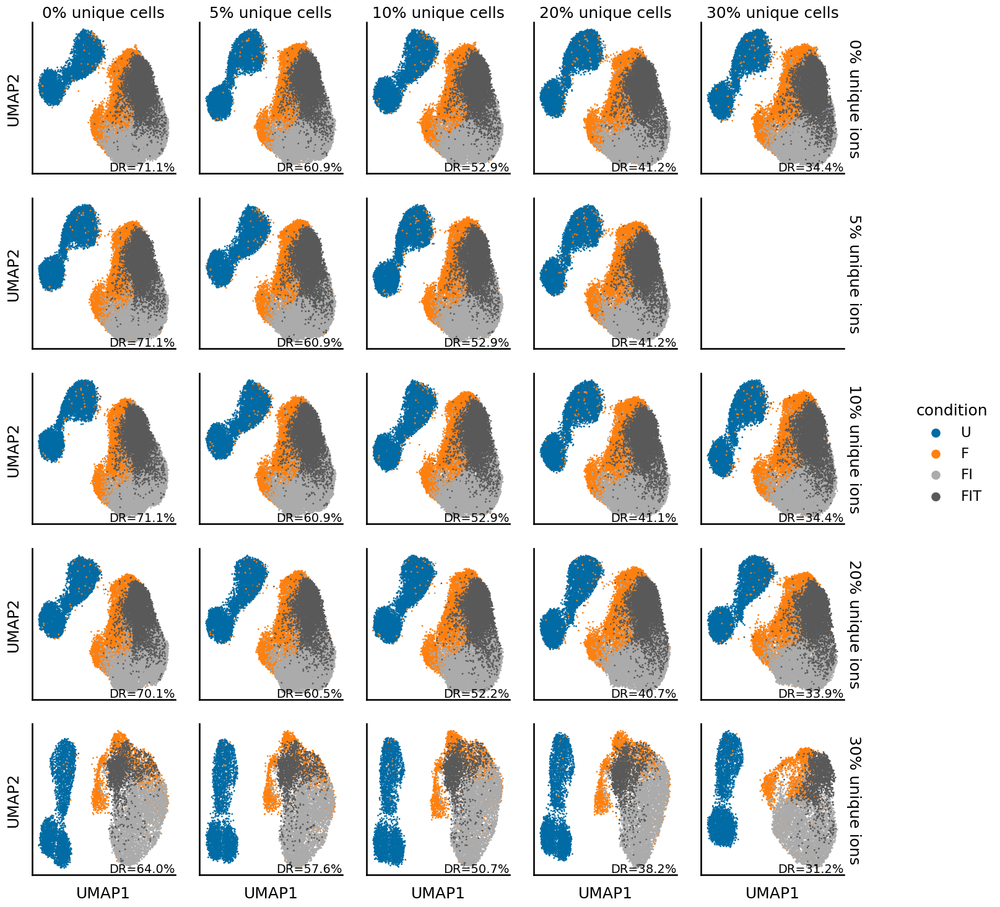

In [19]:
umaps_df["ions"] = [f"{ion:.0%}" for ion in umaps_df["subset_ions"]]
umaps_df["cells"] = [f"{cell:.0%}" for cell in umaps_df["subset_cells"]]

for name in list(datasets.keys()):
    print(name)
    plot = sns.relplot(
        data=umaps_df[
            (umaps_df["dataset"] == name)
            & (umaps_df["subset_ions"].isin(subset_filters))
            & (umaps_df["subset_cells"].isin(subset_filters))
        ],
        x="X_umap-0",
        y="X_umap-1",
        hue="condition",
        hue_order=const.COND_ORDER[ds_dict[name]],
        row="ions",
        col="cells",
        kind="scatter",
        s=dot_size,
        height=plot_height,
        linewidth=0,
        facet_kws=dict(margin_titles=True, sharex=False, sharey=False),
    )

    for sub_ions, sub_cells in plot.axes_dict.keys():
        ax = plot.axes_dict[(sub_ions, sub_cells)]
        ax.set_xticks([])
        ax.set_yticks([])

        try:
            dr = umaps_df.loc[
                (umaps_df["dataset"] == name)
                & (umaps_df["ions"] == sub_ions)
                & (umaps_df["cells"] == sub_cells),
                "dr",
            ].iloc[0]
            ax.text(
                1,
                0,
                f"DR={dr:.1%}",
                transform=ax.transAxes,
                fontsize=14,
                va="bottom",
                ha="right",
            )
        except:
            print(name, sub_ions, sub_cells, "failed")

    plot.set_xlabels("UMAP1")
    plot.set_ylabels("UMAP2")
    plot.set_titles(
        col_template="{col_name} unique cells", row_template="{row_name} unique ions"
    )

    plot.tight_layout()

    plot.savefig(os.path.join(save_adatas, f"umaps_different_filtering_{name}.png"))
    plot.savefig(os.path.join(save_adatas, f"umaps_different_filtering_{name}.pdf"))

In [18]:
umaps_df = pd.concat(res_df.apply(get_umap_coords, axis=1).tolist())
umaps_df.to_csv(os.path.join(save_adatas, "umaps_different_filtering_euclidean.csv"))
umaps_df

,condition,well,X_umap-0,X_umap-1,dataset,subset_ions,subset_cells,dr,adata_path,umap_path_euclidean
cell_id,,,,,,,,,,
21_S3_W5,MiaPaca2,S3_W5,14.601460,3.101327,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
24_S3_W5,MiaPaca2,S3_W5,15.326284,2.782329,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
28_S3_W5,MiaPaca2,S3_W5,13.706941,5.817554,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
29_S3_W5,MiaPaca2,S3_W5,12.043072,5.415295,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
31_S3_W5,MiaPaca2,S3_W5,11.546455,5.311803,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
...,...,...,...,...,...,...,...,...,...,...
2412,FIT,U4,11.516843,7.337802,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
2408,FIT,U4,11.582747,7.487314,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
2405,FIT,U4,8.947655,7.786212,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...


In [19]:
umaps_df = pd.read_csv(os.path.join(save_adatas, "umaps_different_filtering_euclidean.csv"))
umaps_df

/tmp/ipykernel_90/1279743328.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  umaps_df = pd.read_csv(os.path.join(save_adatas, "umaps_different_filtering_euclidean.csv"))


,cell_id,condition,well,X_umap-0,X_umap-1,dataset,subset_ions,subset_cells,dr,adata_path,umap_path_euclidean
0,21_S3_W5,MiaPaca2,S3_W5,14.601460,3.101327,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
1,24_S3_W5,MiaPaca2,S3_W5,15.326284,2.782329,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
2,28_S3_W5,MiaPaca2,S3_W5,13.706941,5.817554,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
3,29_S3_W5,MiaPaca2,S3_W5,12.043072,5.415295,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
4,31_S3_W5,MiaPaca2,S3_W5,11.546455,5.311803,Pancreatic Cancer,0.0,0.0,0.865695,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
...,...,...,...,...,...,...,...,...,...,...,...
1245911,2412,FIT,U4,11.516843,7.337802,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
1245912,2408,FIT,U4,11.582747,7.487314,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
1245913,2405,FIT,U4,8.947655,7.786212,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...
1245914,2398,FIT,U4,12.540799,7.159395,HepaRG,0.3,0.3,0.311952,/home/mklein/sc_imputation_denoising/thesis_an...,/home/mklein/sc_imputation_denoising/thesis_an...


Pancreatic Cancer


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


Seahorse


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


Glioblastoma


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


HepaRG


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


HepaRG 5% 30% failed


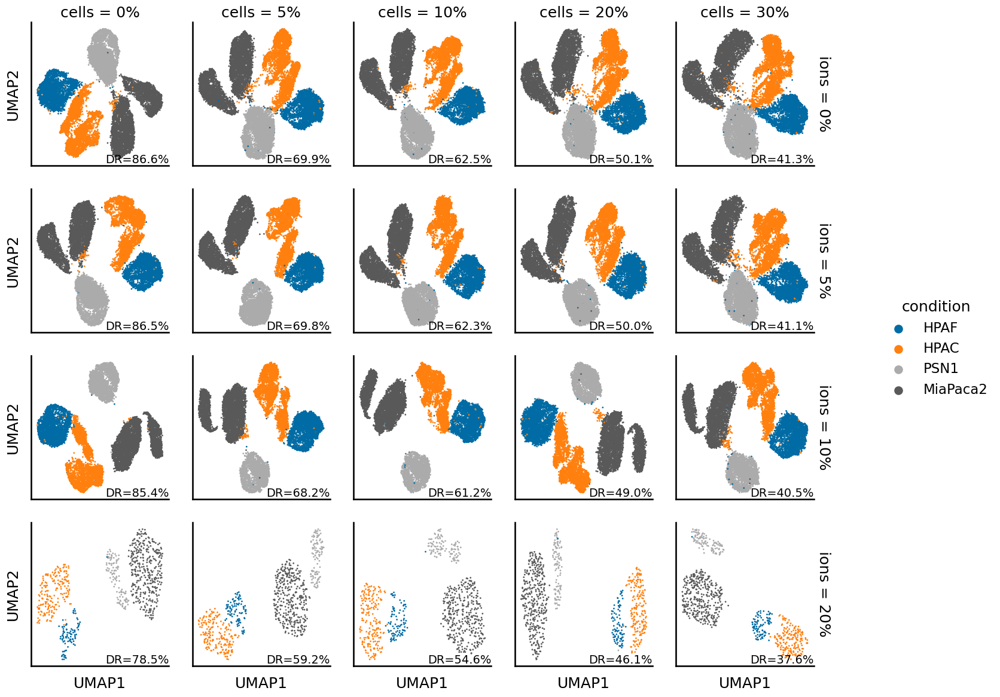

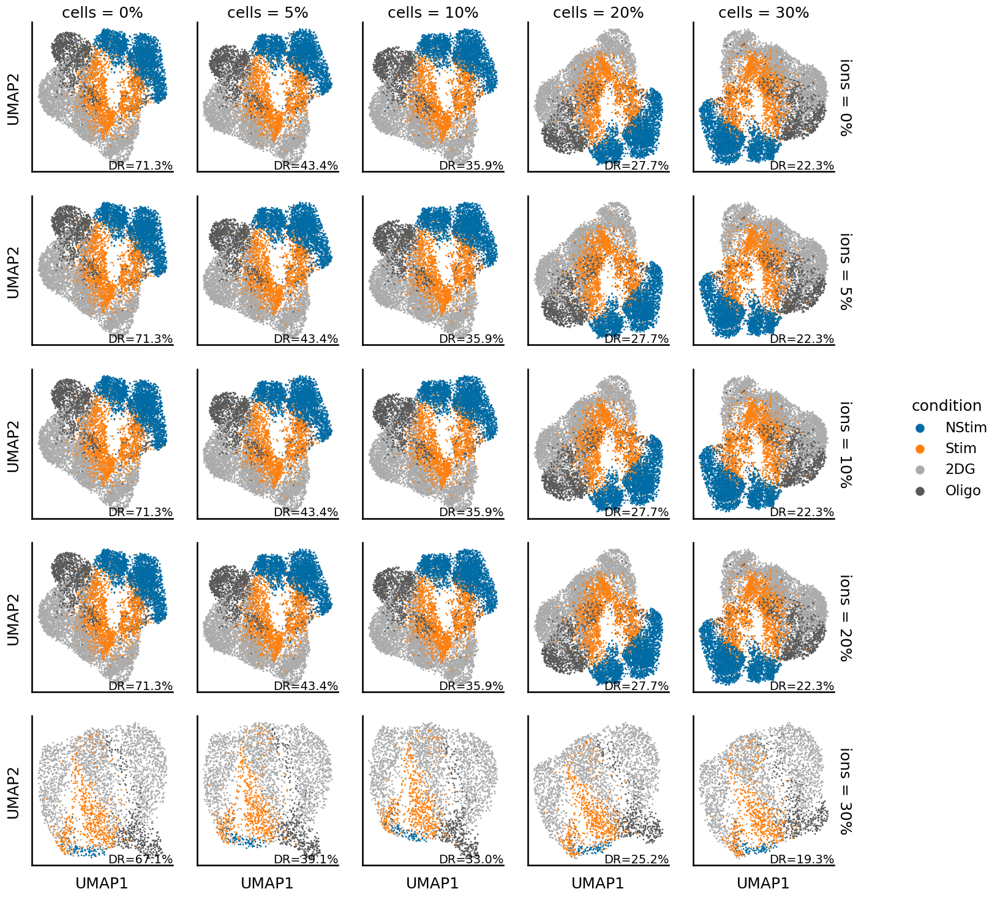

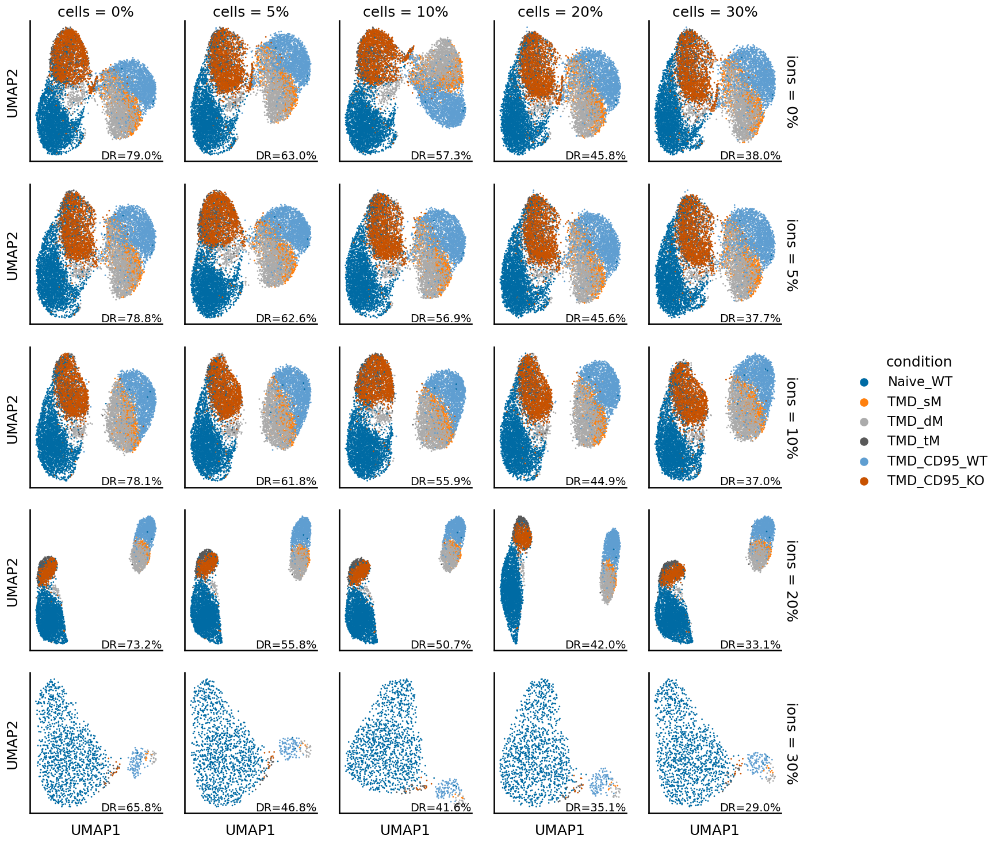

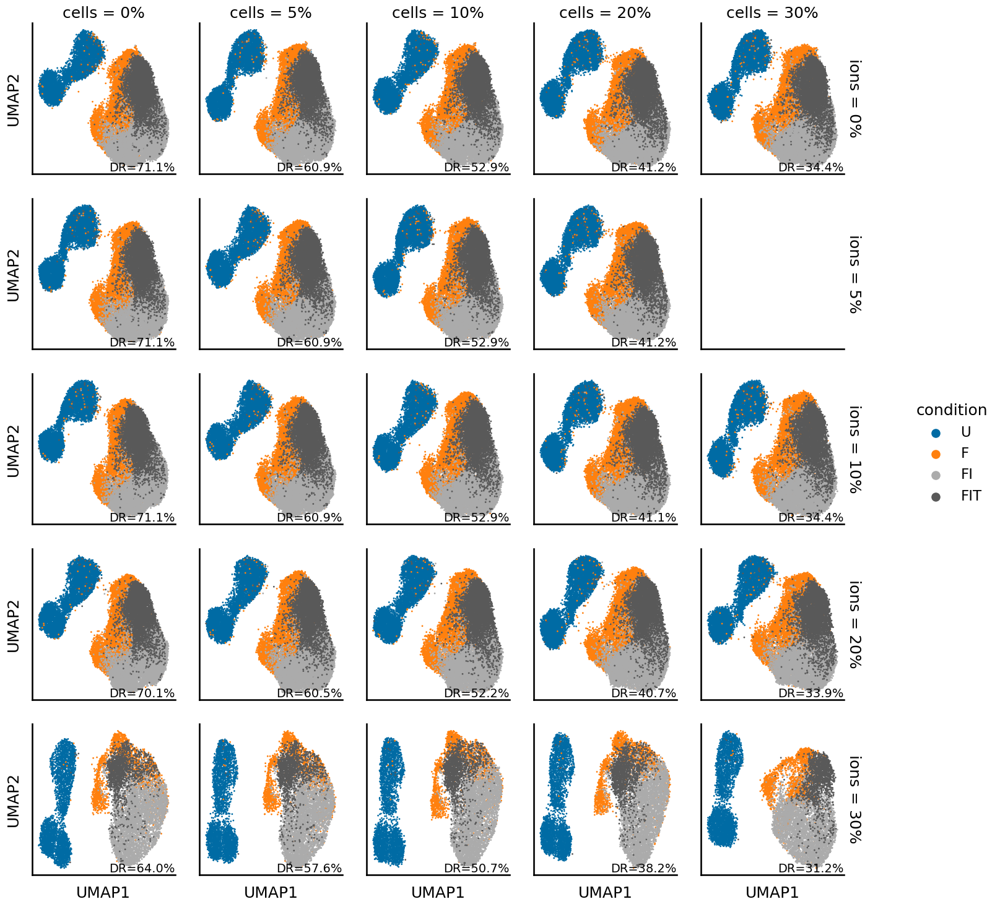

In [20]:
plt.style.use('tableau-colorblind10')

subset_filters = [0.0, 0.05, 0.1, 0.2, 0.3]
umaps_df['ions'] = [f"{ion:.0%}" for ion in umaps_df['subset_ions']]
umaps_df['cells'] = [f"{cell:.0%}" for cell in umaps_df['subset_cells']]

for name in list(datasets.keys()):

    print(name)

    plot = sns.relplot(
        data=umaps_df[(umaps_df['dataset'] == name) & (umaps_df['subset_ions'].isin(subset_filters)) & (umaps_df['subset_cells'].isin(subset_filters))],
        x='X_umap-0', y='X_umap-1',
        hue='condition', hue_order=const.COND_ORDER[ds_dict[name]],
        row='ions', col='cells',
        kind='scatter', s=dot_size, height=plot_height, linewidth=0,
        facet_kws=dict(margin_titles=True, sharex=False, sharey=False),
    )
        
    for sub_ions, sub_cells in plot.axes_dict.keys():
        ax = plot.axes_dict[(sub_ions, sub_cells)]
        ax.set_xticks([])
        ax.set_yticks([])

        try:
            dr = umaps_df.loc[(umaps_df['dataset'] == name) & (umaps_df['ions'] == sub_ions) & (umaps_df['cells'] == sub_cells), 'dr'].iloc[0]
            ax.text(1, 0, f"DR={dr:.1%}", transform=ax.transAxes, fontsize=14, va='bottom', ha='right')
        except:
            print(name, sub_ions, sub_cells, "failed")
    
    plot.set_xlabels("UMAP1")
    plot.set_ylabels("UMAP2")

    plot.tight_layout()
    
    plot.savefig(os.path.join(save_adatas, f"umaps_different_filtering_euclidean_{name}.png"))
    plot.savefig(os.path.join(save_adatas, f"umaps_different_filtering_euclidean_{name}.pdf"))

In [20]:
const.NARROW_BBOX.update(fc="white", boxstyle="round,pad=0.1")

/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/distributions.py:254: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  baselines.iloc[:, cols] = (curves
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


Pancreatic Cancer Mean:  {'HPAC': 232.48458274398868, 'HPAF': 234.02908726178535, 'MiaPaca2': 234.8501397949674, 'PSN1': 192.37453874538744}
Pancreatic Cancer Min:  22


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/distributions.py:254: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  baselines.iloc[:, cols] = (curves
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


Seahorse Mean:  {'2DG': 298.5005988023952, 'NStim': 246.9266692396758, 'Oligo': 273.2460910944935, 'Stim': 276.33153800119686}
Seahorse Min:  203


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/distributions.py:254: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  baselines.iloc[:, cols] = (curves
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


Glioblastoma Mean:  {'Naive_WT': 422.5074380165289, 'TMD_CD95_KO': 261.3497267759563, 'TMD_CD95_WT': 294.40786115364983, 'TMD_dM': 266.64199561403507, 'TMD_sM': 254.63388370423547, 'TMD_tM': 290.3474218089603}
Glioblastoma Min:  5


/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/distributions.py:254: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  baselines.iloc[:, cols] = (curves
/home/mklein/miniconda3/envs/corr_env/lib/python3.10/site-packages/seaborn/axisgrid.py:130: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < LooseVersion("3.0"):


HepaRG Mean:  {'F': 191.90557939914163, 'FI': 232.0064239828694, 'FIT': 204.69949545913218, 'U': 228.3711684370258}
HepaRG Min:  10


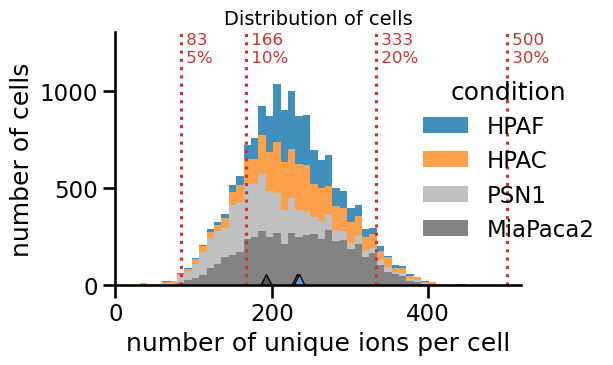

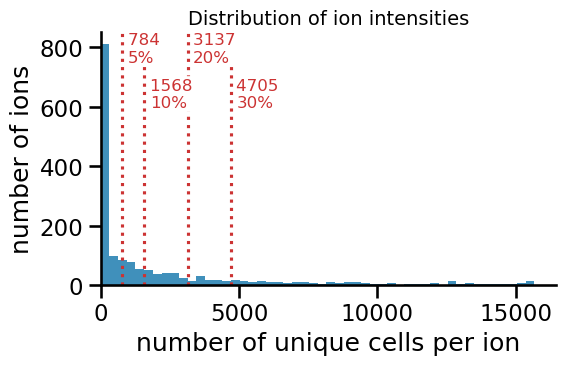

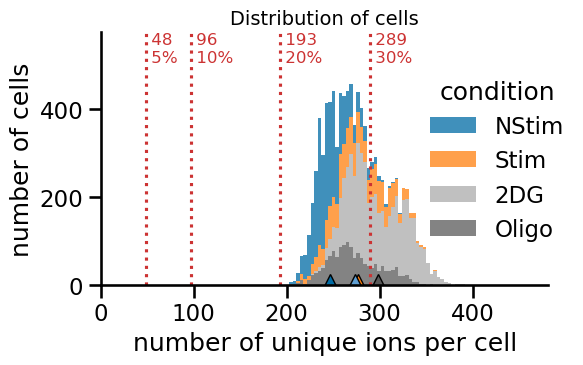

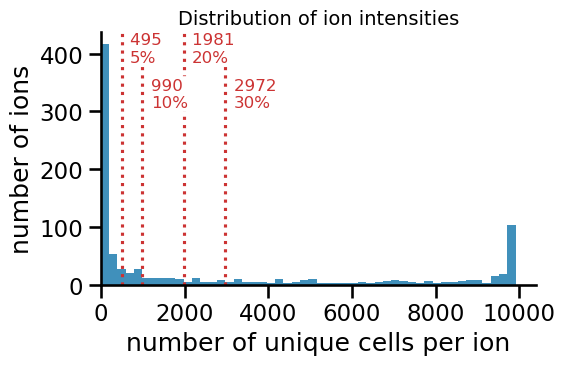

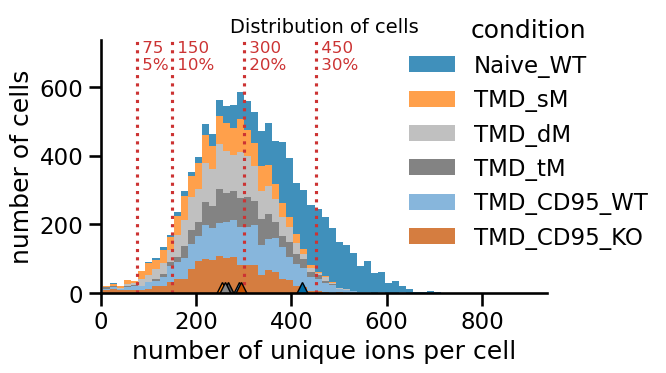

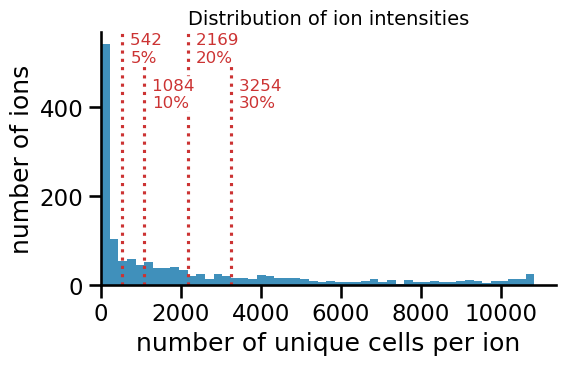

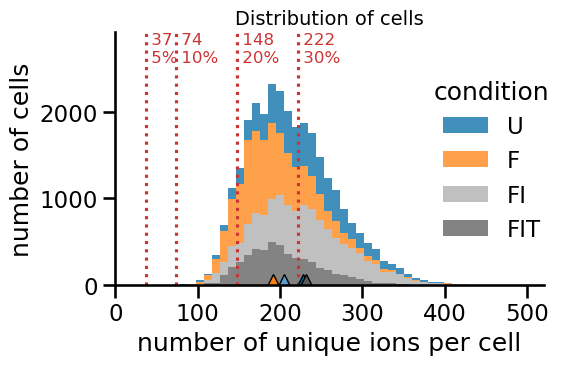

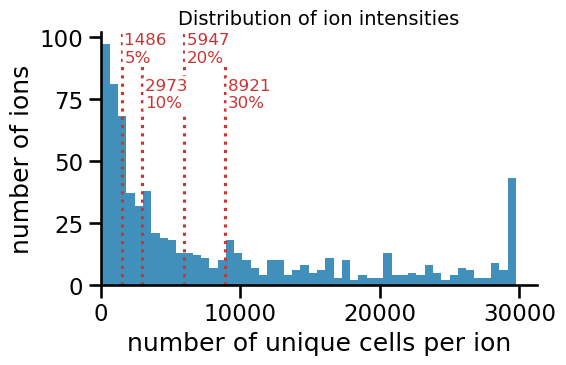

In [26]:
for name, adata in datasets.items():
    cell_qc_df, ion_qc_df = sc.pp.calculate_qc_metrics(adata, percent_top=None)
    cell_qc = pd.merge(adata.obs, cell_qc_df, left_index=True, right_index=True)
    ion_qc = pd.merge(adata.var, ion_qc_df, left_index=True, right_index=True)
    ion_qc["fdr"] = ion_qc["fdr"].replace(np.nan, 1)
    cell_qc["condition"].value_counts()

    ipl = sns.displot(
        data=cell_qc,
        x="n_genes_by_counts",
        bins=50,
        linewidth=0,
        hue="condition",
        multiple="stack",
        height=4,
        aspect=1.5,
        hue_order=const.COND_ORDER[ds_dict[name]],
    )

    ipl_ax = ipl.axes.flat[0]
    ipl_ax.set_ylim(top=ipl_ax.get_ylim()[1] * 1.2)
    if name in ["Seahorse", "Glioblastoma"]:
        ipl_ax.set_xlim(right=ipl_ax.get_xlim()[1] * 1.2)

    ipl_ax.set_xlabel("number of unique ions per cell")
    ipl_ax.set_ylabel("number of cells")
    ipl_ax.set_xlim(left=0)
    ipl_ax.set_title(f"Distribution of cells", size=14)
    for x in subset_filters:
        if x > 0 and x * len(adata.var_names) < ipl_ax.get_xlim()[1]:
            ipl_ax.axvline(x=x * len(adata.var_names), linestyle=":", c="#CC3333")
            # ipl_ax.text(x=x*len(adata.var_names), y=ipl_ax.get_ylim()[1], s=f" {x:.0%}", va='top', ha='left', color="#CC3333")
            ipl_ax.text(
                x=x * len(adata.var_names),
                y=ipl_ax.get_ylim()[1],
                s=f" {int(x*len(adata.var_names)):d} \n {x:.0%}",
                size=12,
                va="top",
                ha="left",
                color="#CC3333",
            )

    mean_ions = cell_qc.groupby("condition")["n_genes_by_counts"].mean().to_dict()
    print(name, "Mean: ", mean_ions)

    min_ions = cell_qc["n_genes_by_counts"].min()
    print(name, "Min: ", min_ions)
    for c, cond in enumerate(const.COND_ORDER[ds_dict[name]]):
        ipl_ax.plot(
            mean_ions[cond],
            ipl_ax.get_ylim()[1] / 60,
            marker="^",
            markersize=10,
            markeredgecolor="black",
            color=const.COLORBLIND_COLORS[c],
        )

    sns.move_legend(ipl, "lower right", bbox_to_anchor=(0.8, 0.3), ncol=1)
    ipl.tight_layout()
    # ipl.fig.savefig(os.path.join('/home/mklein/Dropouts/tests/Data_subsetting', f'ion_filtering_{name}.pdf'))
    # ipl.fig.savefig(os.path.join('/home/mklein/Dropouts/tests/Data_subsetting', f'ion_filtering_{name}.png'))

    cpl = sns.displot(
        data=ion_qc,
        x="n_cells_by_counts",
        bins=50,
        linewidth=0,
        multiple="stack",
        height=4,
        aspect=1.5,
    )
    cpl_ax = cpl.axes.flat[0]
    cpl_ax.set_xlabel("number of unique cells per ion")
    cpl_ax.set_ylabel("number of ions")
    cpl_ax.set_xlim(left=0)
    cpl_ax.set_title(f"Distribution of ion intensities", size=14)
    for i, x in enumerate(subset_filters):
        if x > 0 and x * len(adata.obs_names) < cpl_ax.get_xlim()[1]:
            # cpl_ax.text(x=x*len(adata.obs_names), y=cpl_ax.get_ylim()[1], s=f" {x:.0%}", va='top', ha='left', color="#CC3333")
            text = f"{int(x*len(adata.obs_names)):d} \n{x:.0%}"
            if i % 2 == 0:
                y = cpl_ax.get_ylim()[1] * 0.82
            else:
                y = cpl_ax.get_ylim()[1]
            cpl_ax.text(
                x=x * len(adata.obs_names) + 200,
                y=y,
                s=text,
                size=12,
                va="top",
                ha="left",
                color="#CC3333",
                bbox=const.NARROW_BBOX,
            )
            cpl_ax.axvline(x=x * len(adata.obs_names), linestyle=":", c="#CC3333")
    cpl.tight_layout()
    # cpl.fig.savefig(os.path.join('/home/mklein/Dropouts/tests/Data_subsetting', f'cell_filtering_{name}.pdf'))
    # cpl.fig.savefig(os.path.join('/home/mklein/Dropouts/tests/Data_subsetting', f'cell_filtering_{name}.png'))